<h1><center>ASSIGNMENT 07</center></h1>
<div style="text-align: right">Name: Harsh</div>
<div style="text-align: right">Roll: 200123022</div>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import random
import math
from datetime import datetime, timedelta
import datetime as dt
from scipy.stats import norm
import seaborn as sns
# sns.set(style="darkgrid")

<h3><center>Question 1</center></h3>

## Parameter
<p> t-> time of evaluating option price</br>
T-> expiry time</br>
sigma, mu</br>
x-> S(t)</br>
K-> strike price</br>
c-> 1 for call option 0 for put</p>


The solution to the Black-Scholes-Merton equation with terminal condition and boundary conditions is -
$$ c(t, x) = xN(d_{+}(T − t, x))− Ke^{−r(T −t)}N(d_{−}(T − t, x)) $$
$where$ $0 ≤ t < T$ $and$ $x > 0$
$where$
$$ d_{\pm}(\tau,x) = \frac{1}{\sigma \sqrt{\tau}} \left[log \frac{x}{K} + (r \pm \frac{\sigma ^{2}}{2}\right] $$ 
and N is the cumulative standard normal distribution
By put call parity we know that -
$$ f(t,x) = x - e^{-r(T-t)}K = c(t,x) - p(t,x)$$
where f is the value of a forward quantity at time t ∈ [0, T] where stock price at time t is S(t) = x. Therefore,
$$ p(t,x) = x(N(d_{+}(T-t,x))-1)-Ke^{-r(T-t)}(N(d_{-}(T-t,x))-1)=Ke^{-r(T-t)}N(-d_{-}(T-t,x))-xN(-d_{+}(T-t,x))$$
Using above formulas for c(t, x) and p(t, x), prices for European call and put option is computed for
0 ≤ t < T. For t = T, c(t, x) = max(x − K, 0) and p(t, x) = max(K − x, 0)

In [2]:
def optionPrice(t, T, sigma, r, x, K, c):
    if(T==t):
        if c==1:
            return max(x-K,0)
        else :
            return max(K-x,0)
    d1 = (math.log(x/K)+(r+(sigma*sigma)/2)*(T-t))/(sigma*(math.sqrt(T-t)))
    d2 = d1-(sigma*(math.sqrt(T-t)))
    call_p = x*(norm(0,1).cdf(d1))-K*math.pow(math.e,-r*(T-t))*(norm(0,1).cdf(d2))
    if c == 1:
        return call_p
    else:
        return call_p+K*math.pow(math.e,-r*(T-t))-x

In [3]:
T = 1
K = 1
sigma = 0.6
r = 0.05


<h3><center>Question 2</center></h3>

2d plots for the Value of options (c(t, x)) is plotted by varying price of the underlying at a given time.
This plot is plotted for t = [ 0.0, 0.2, 0.4, 0.6, 0.8, 1.0 ]
* By increasing the price of the underlying, call prices increases while put prices decreases.
* As time to maturity (T − t) decreases value of the options decreases.
3d scatter plots are plotted by varying time and stock price at that time simultaneously.
* Plots are suitably rotated to get a better view.

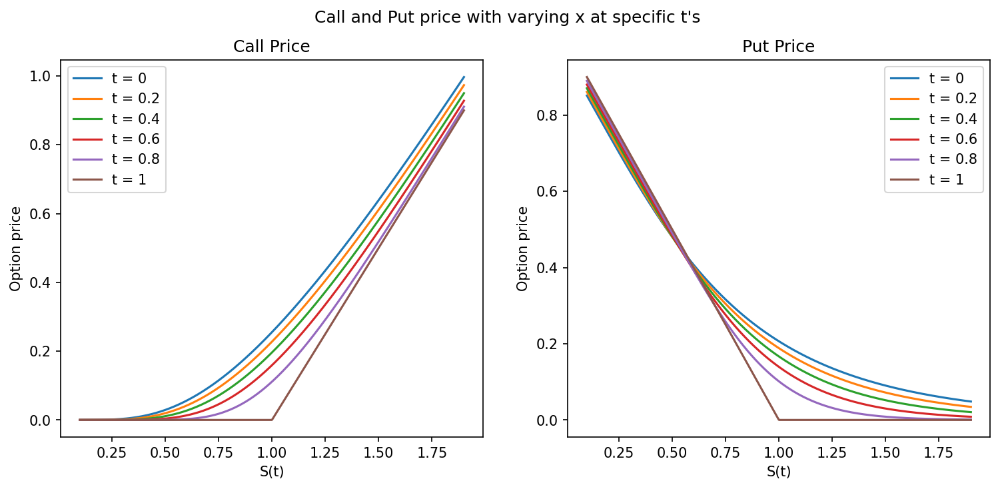

In [4]:
t_array = [0,0.2,0.4,0.6,0.8,1]
fig, ax = plt.subplots(nrows = 1,ncols = 2)
for t in t_array:
    x_Axis = []
    y_Axis = []
    z_Axis = []
    for x in np.linspace(0.1,1.9,1000):
        x_Axis.append(x)
        y_Axis.append(optionPrice(t, T, sigma, r, x, K, 1))
        z_Axis.append(optionPrice(t, T, sigma, r, x, K, 0))
    ax[0].plot(x_Axis,y_Axis,label=f't = {t}')
    ax[1].plot(x_Axis,z_Axis,label=f't = {t}')
fig.suptitle("Call and Put price with varying x at specific t's ")
fig.set_size_inches(12, 5)
fig.set_dpi(150)
ax[0].set_title("Call Price")
ax[0].set_xlabel("S(t)")
ax[0].set_ylabel("Option price")
ax[1].set_title("Put Price")
ax[1].set_xlabel("S(t)")
ax[1].set_ylabel("Option price")
ax[0].legend()
ax[1].legend()
plt.show()

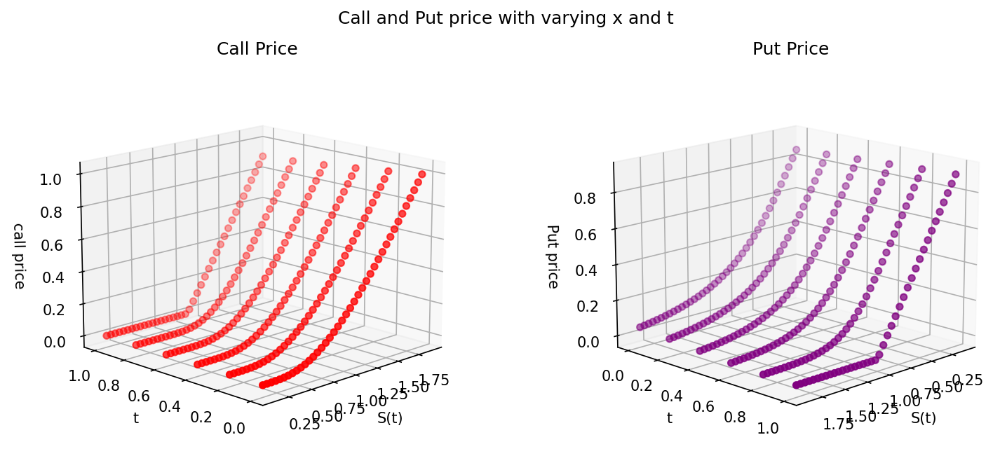

In [5]:
t_array = [0,0.2,0.4,0.6,0.8,1]
fig, ax = plt.subplots(nrows = 1,ncols = 2,subplot_kw={"projection": "3d"})
call_p = np.zeros((6,40))
put_p = np.zeros((6,40))
x_Axis = np.linspace(0.1,1.9,40)
t_axis, S_axis = np.meshgrid(t_array, x_Axis)
for i in range(len(t_array)):
    for j in range(len(x_Axis)):
        call_p[i][j]=optionPrice(t_array[i], T, sigma, r, x_Axis[j], K, 1)
        put_p[i][j]=optionPrice(t_array[i], T, sigma, r, x_Axis[j], K, 0)
call_p=call_p.T
put_p=put_p.T
fig.suptitle("Call and Put price with varying x and t ")
fig.set_size_inches(12, 5)
fig.set_dpi(150)
ax[0].scatter3D(S_axis,t_axis,call_p,color='red')
ax[0].set_title("Call Price")
ax[0].set_xlabel("S(t)")
ax[0].set_ylabel("t")
ax[0].set_zlabel("call price")
ax[1].scatter3D(S_axis,t_axis,put_p,color='purple')
ax[1].set_title("Put Price")
ax[1].set_xlabel("S(t)")
ax[1].set_ylabel("t")
ax[1].set_zlabel("Put price")
ax[0].view_init(15,-135)
ax[1].view_init(15,45)
plt.show()
    

<h3><center>Question 3</center></h3>

Surface plots are plotted by varying time and stock price at that time simultaneously.
These plots are the surface plot version of the 3d scatter plots obtained in question 2.
Plots are suitably rotated to get a better view.

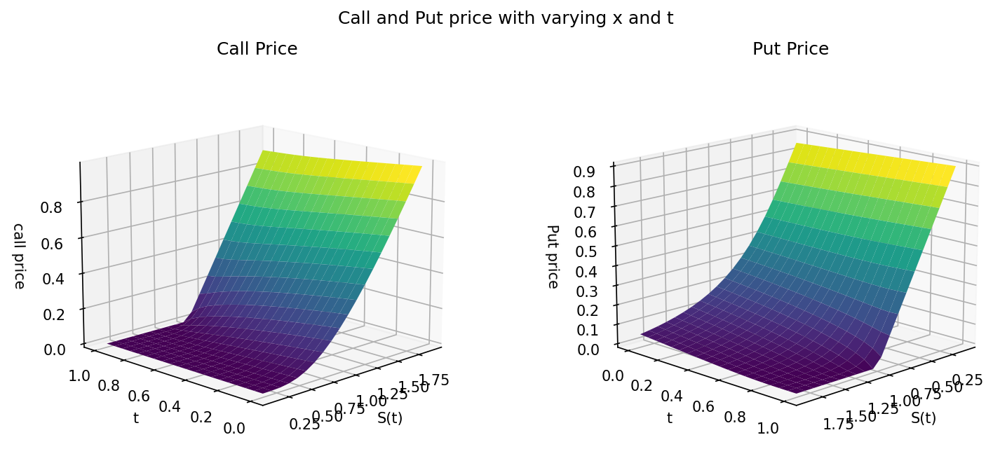

In [6]:
t_array = np.linspace(0,1,20)
fig, ax = plt.subplots(nrows = 1,ncols = 2,subplot_kw={"projection": "3d"})
call_p = np.zeros((20,20))
put_p = np.zeros((20,20))
x_Axis = np.linspace(0.1,1.9,20)
t_axis, S_axis = np.meshgrid(t_array, x_Axis)
for i in range(len(t_array)):
    for j in range(len(x_Axis)):
        call_p[i][j]=optionPrice(t_array[i], T, sigma, r, x_Axis[j], K, 1)
        put_p[i][j]=optionPrice(t_array[i], T, sigma, r, x_Axis[j], K, 0)
call_p=call_p.T
put_p=put_p.T
fig.suptitle("Call and Put price with varying x and t ")
fig.set_size_inches(12, 5)
fig.set_dpi(150)
ax[0].plot_surface(S_axis,t_axis,call_p,cmap='viridis')
ax[0].set_title("Call Price")
ax[0].set_xlabel("S(t)")
ax[0].set_ylabel("t")
ax[0].set_zlabel("call price")
ax[1].plot_surface(S_axis,t_axis,put_p,cmap='viridis')
ax[1].set_title("Put Price")
ax[1].set_xlabel("S(t)")
ax[1].set_ylabel("t")
ax[1].set_zlabel("Put price")
ax[0].view_init(15,-135)
ax[1].view_init(15,45)
plt.show()
    

<h3><center>Question 4</center></h3>

I have done the senstivity analysis for the value of European call and put option as a function of following
model parameters
* Strike Price (K)
* Risk Free Return (r)
* Sigma (σ)
* Time of expiration (T)
2d plots are plotted assuming price of the underlying asset as 1 at different time points. All other values
are taken as given in question 2, i.e. K = 1, T = 1, r = 0.05, σ = 0.6.
One by one all these model parameters are varied and options price at given point of time is plotted.

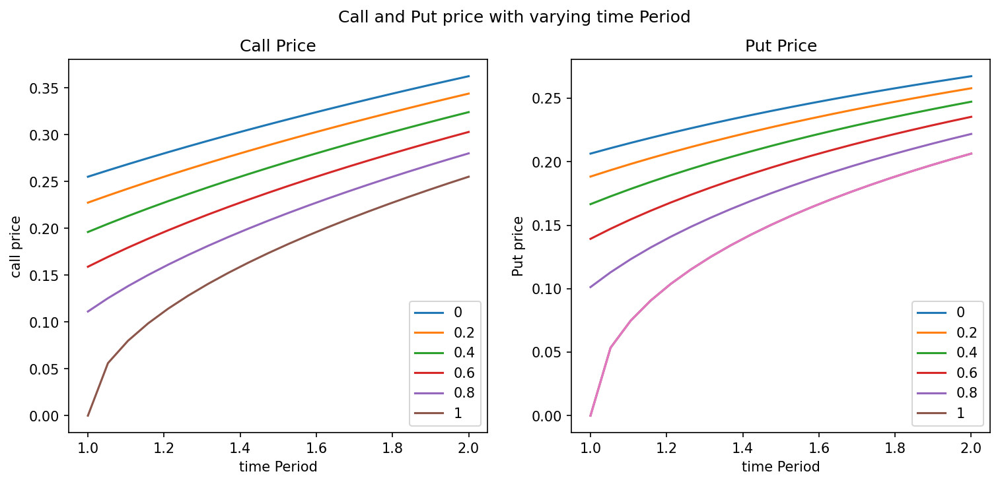

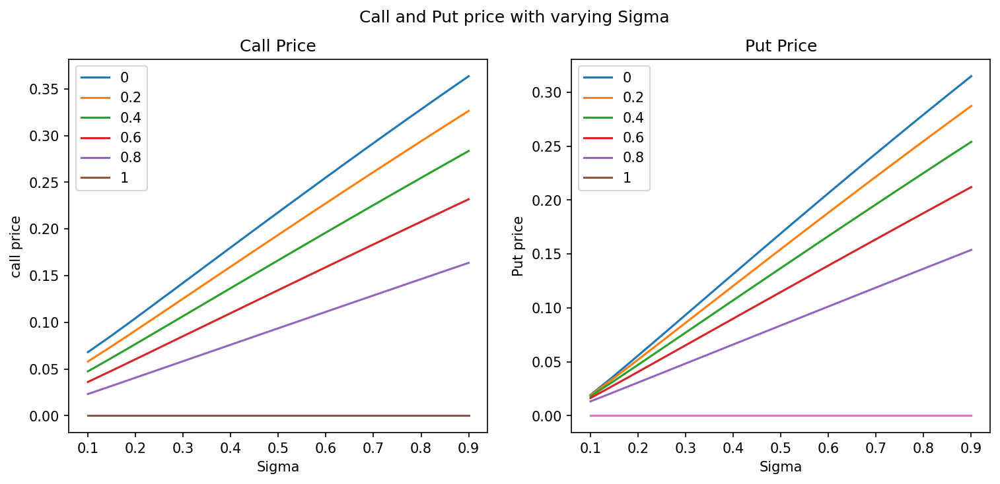

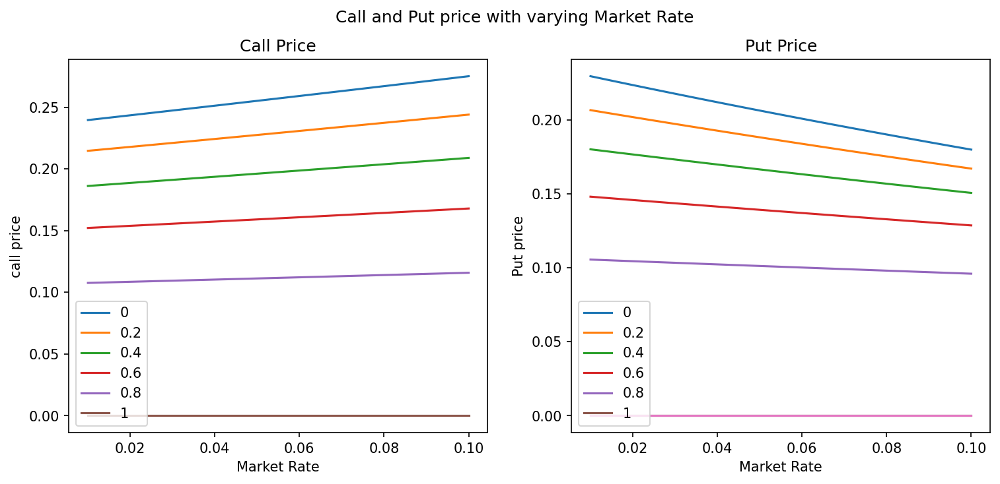

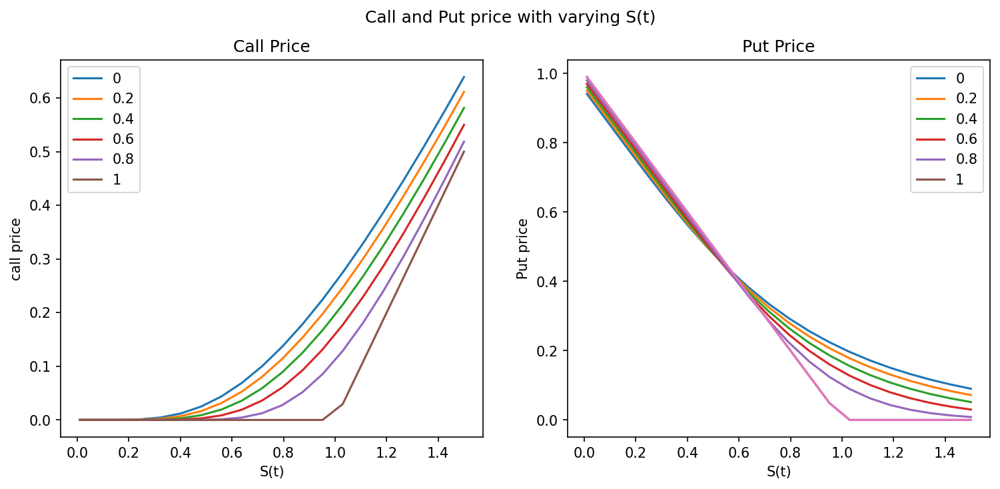

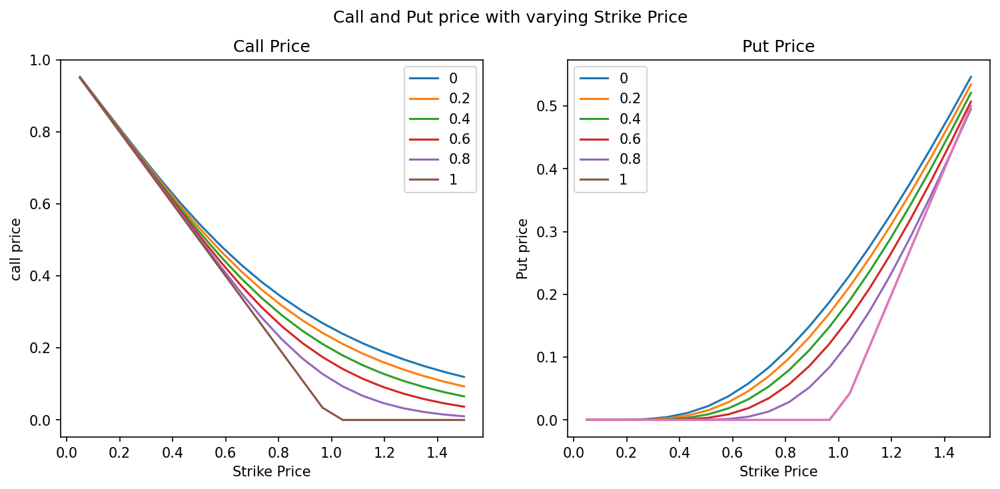

...

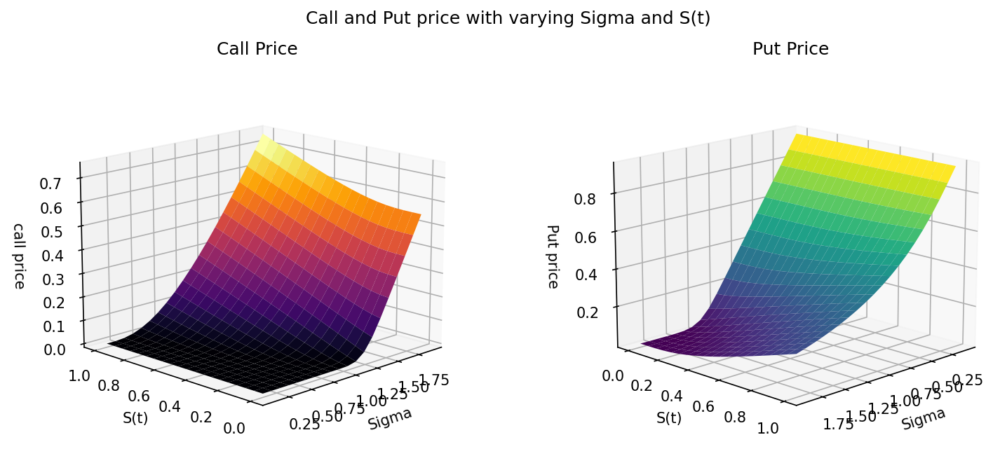

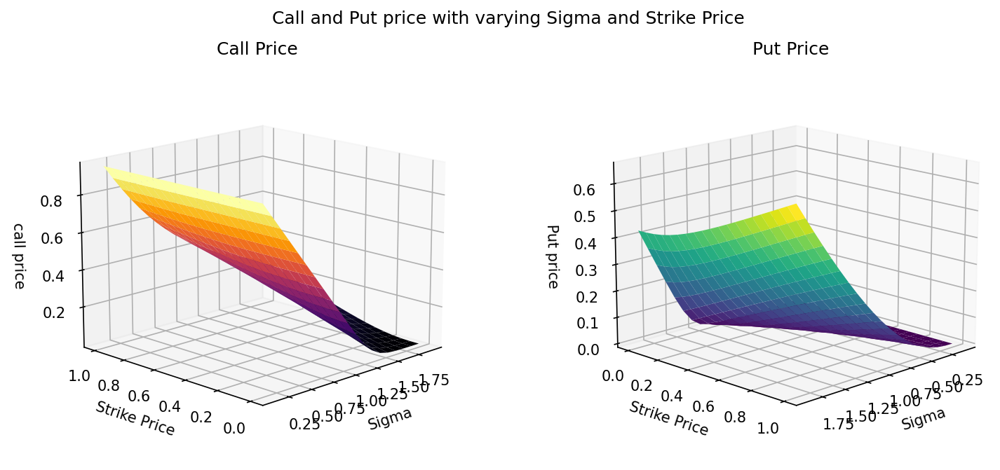

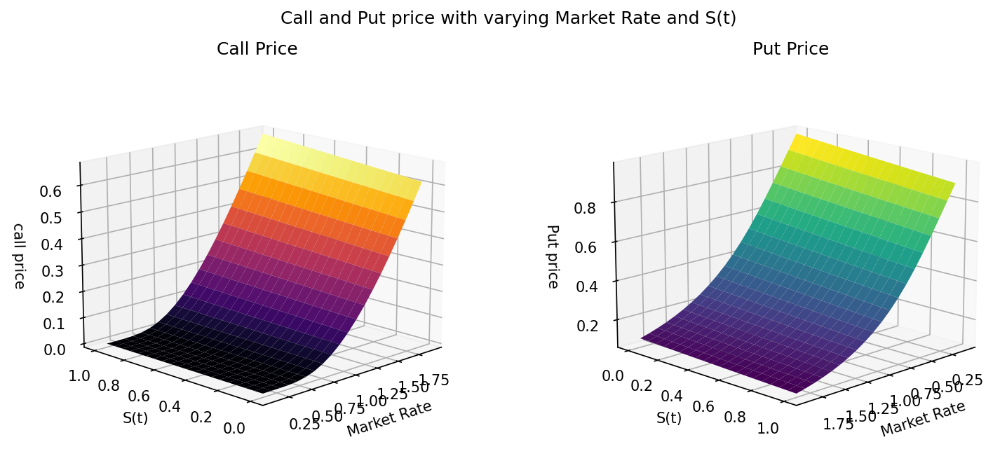

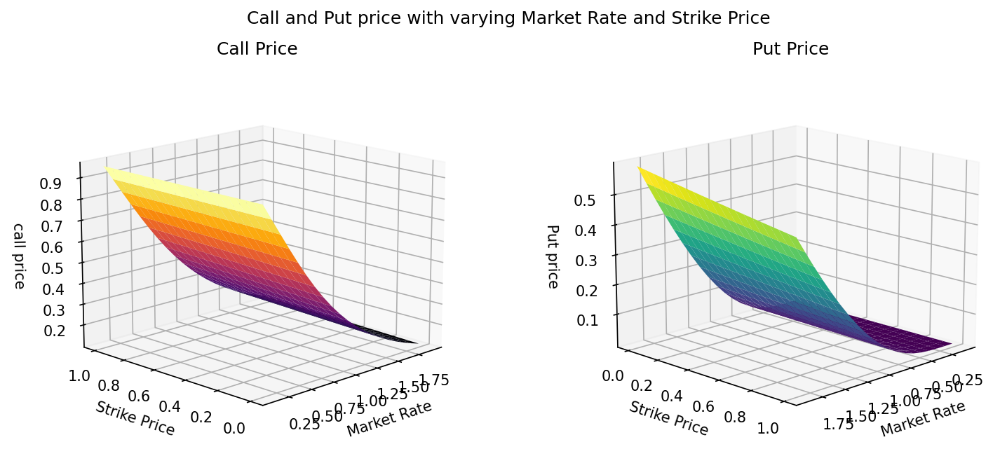

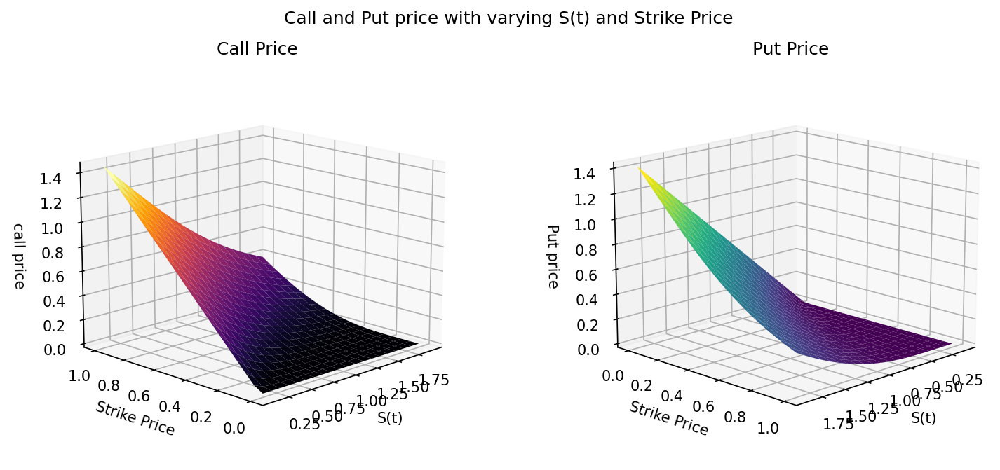

In [7]:
# def optionPrice(t, T, sigma, r, x, K, c):
varying = []
varying.append(np.linspace(0,1,20))
varying.append(np.linspace(1,2,20))
varying.append(np.linspace(0.1,0.9,20))
varying.append(np.linspace(0.01,0.1,20))
varying.append(np.linspace(0.01,1.5,20))
varying.append(np.linspace(0.05,1.5,20))

names = ["start time", "time Period", "Sigma", "Market Rate", "S(t)", "Strike Price"]
for i in range(1,6):
    fig, ax = plt.subplots(nrows = 1,ncols = 2)
    for st in [0,0.2,0.4,0.6,0.8,1]:
        call_p = []
        put_p = []
        params = [st, 1, 0.6, 0.05, 1, 1]
        for ii in range(len(varying[i])):
            params[i]=varying[i][ii]
            call_p.append(optionPrice(params[0],params[1],params[2],params[3],params[4],params[5],1))
            put_p.append(optionPrice(params[0],params[1],params[2],params[3],params[4],params[5],0))
            fig.suptitle("Call and Put price with varying "+names[i])
        ax[0].plot(varying[i],call_p)
        ax[1].plot(varying[i],put_p)
    fig.set_size_inches(12, 5)
    fig.set_dpi(150)
    ax[0].set_title("Call Price")
    ax[0].set_xlabel(names[i])
    ax[0].set_ylabel("call price")
    ax[1].plot(varying[i],put_p)
    ax[1].set_title("Put Price")
    ax[1].set_xlabel(names[i])
    ax[1].set_ylabel("Put price")
    ax[0].legend([0,0.2,0.4,0.6,0.8,1])
    ax[1].legend([0,0.2,0.4,0.6,0.8,1])
    plt.show()

for i in range(6):
    for j in range(i+1,6):
        fig, ax = plt.subplots(nrows = 1,ncols = 2,subplot_kw={"projection": "3d"})
        call_p = np.zeros((20,20))
        put_p = np.zeros((20,20))
        p_axis, q_axis = np.meshgrid(varying[i],varying[j])
        params = [0, 1, 0.6, 0.05, 1, 1]
        for ii in range(len(p_axis)):
            for jj in range(len(q_axis)):
                params[i]=varying[i][ii]
                params[j]=varying[j][jj]
                call_p[ii][jj]=optionPrice(params[0],params[1],params[2],params[3],params[4],params[5],1)
                put_p[ii][jj]=optionPrice(params[0],params[1],params[2],params[3],params[4],params[5],0)
        call_p=call_p.T
        put_p=put_p.T
        fig.suptitle("Call and Put price with varying "+names[i]+" and "+names[j])
        fig.set_size_inches(12, 5)
        fig.set_dpi(150)
        ax[0].plot_surface(S_axis,t_axis,call_p,cmap='inferno')
        ax[0].set_title("Call Price")
        ax[0].set_xlabel(names[i])
        ax[0].set_ylabel(names[j])
        ax[0].set_zlabel("call price")
        ax[1].plot_surface(S_axis,t_axis,put_p,cmap='viridis')
        ax[1].set_title("Put Price")
        ax[1].set_xlabel(names[i])
        ax[1].set_ylabel(names[j])
        ax[1].set_zlabel("Put price")
        ax[0].view_init(15,-135)
        ax[1].view_init(15,45)
        plt.show()
    


<h3><center>Question 5</center></h3>

The solution to the Black-Scholes-Merton equation with terminal condition and boundary conditions is with continous paying dividends -
$$ c(t, x) = xe^{−a(T −t)}N(d_{+}(T − t, x))− Ke^{−r(T −t)}N(d_{−}(T − t, x)) $$
$$ d_{\pm}(\tau,x) = \frac{1}{\sigma \sqrt{\tau}} \left[log \frac{x}{K} + (r - a \pm \frac{\sigma ^{2}}{2}\right] $$ 
$$ p(t,x) = xe^{-a(T-t)}(N(d_{+}(T-t,x))-1)-Ke^{-r(T-t)}(N(d_{-}(T-t,x))-1)=Ke^{-r(T-t)}N(-d_{-}(T-t,x))-xe^{-a(T-t)}N(-d_{+}(T-t,x))$$

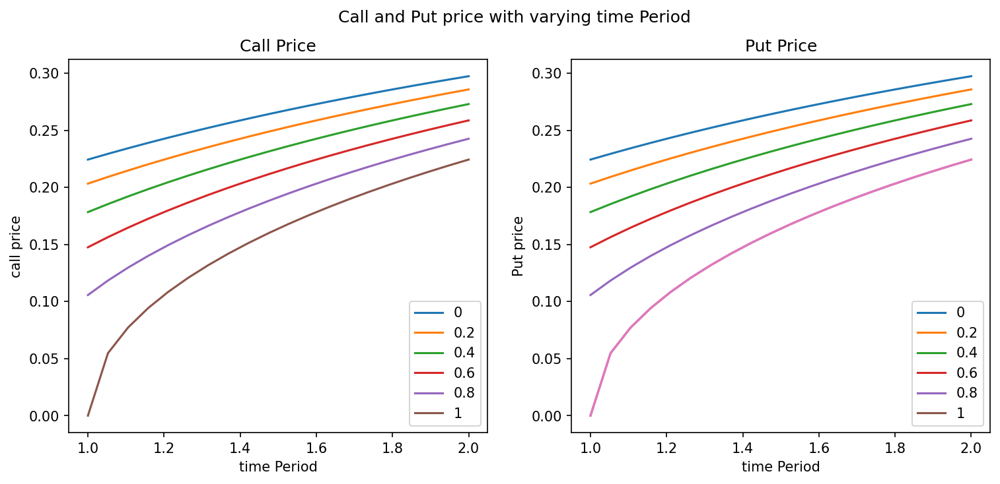

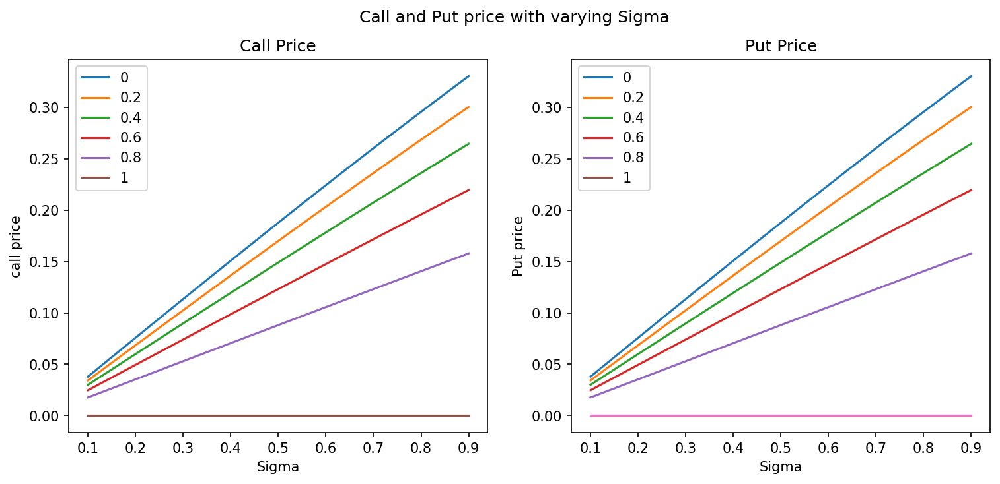

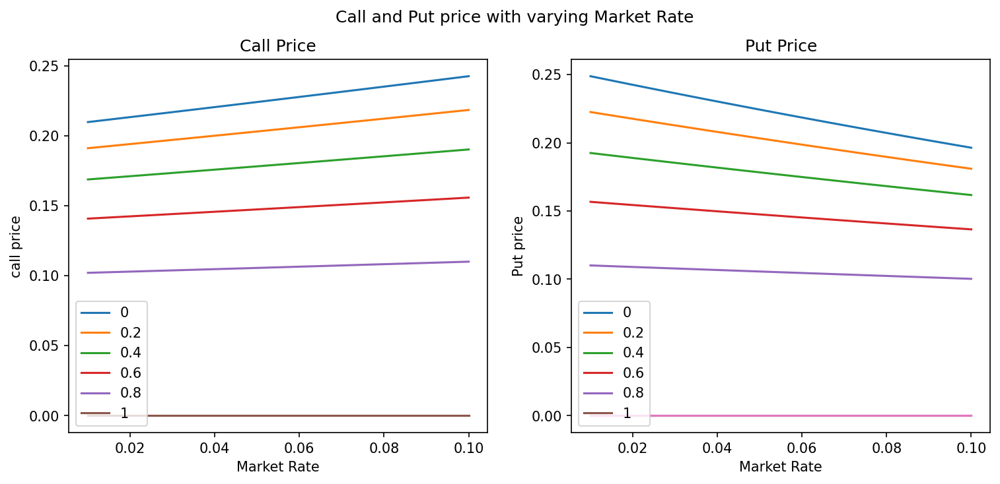

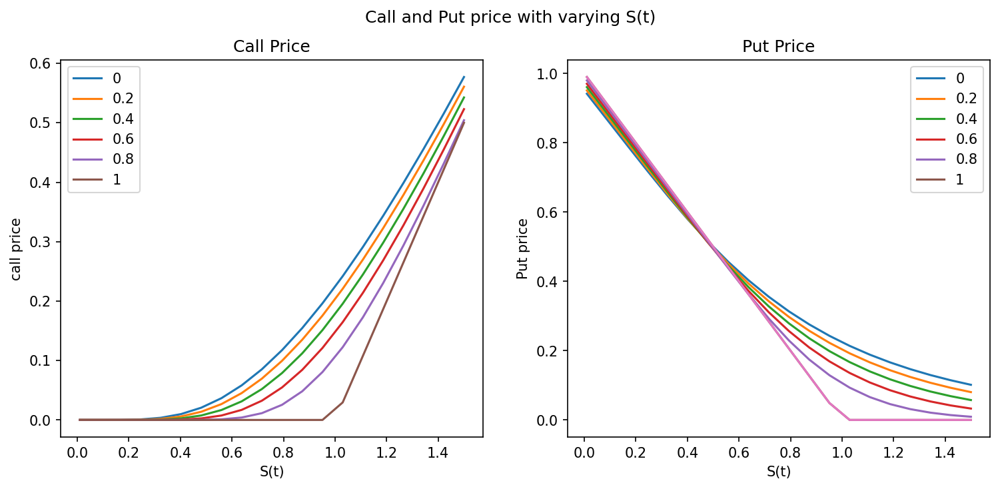

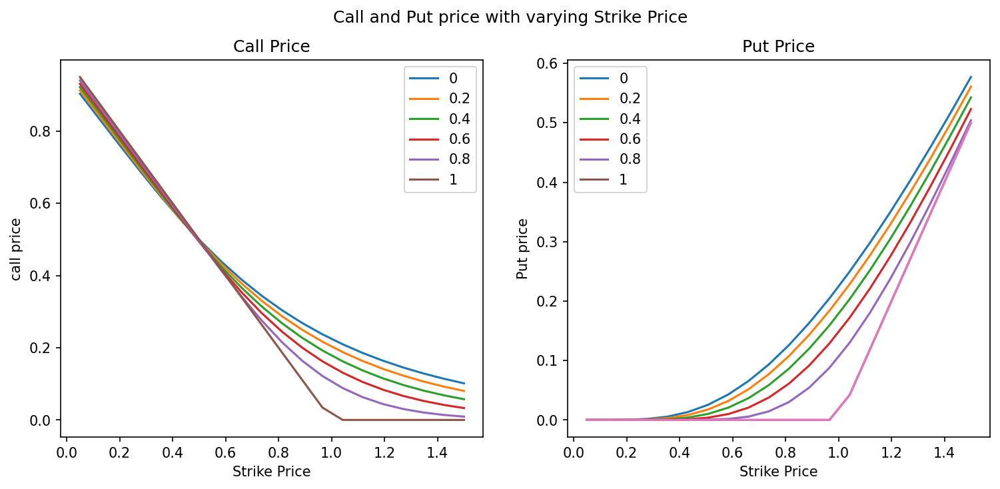

...

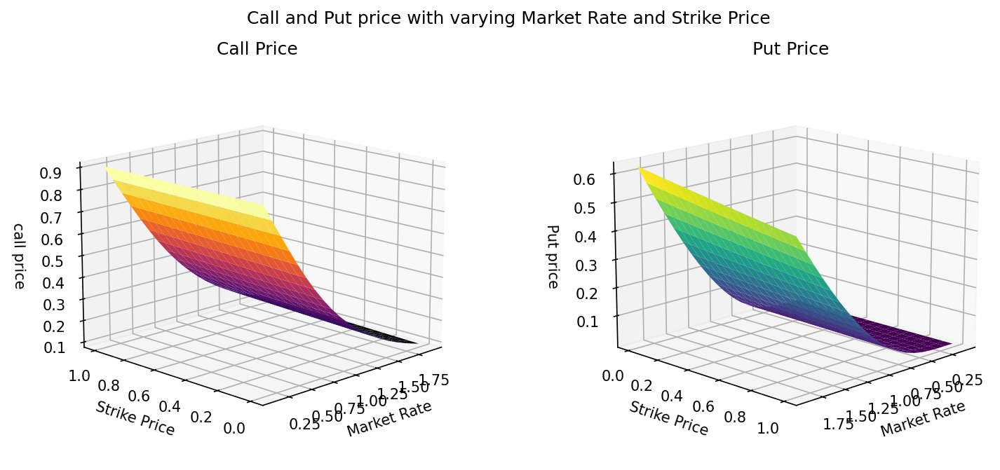

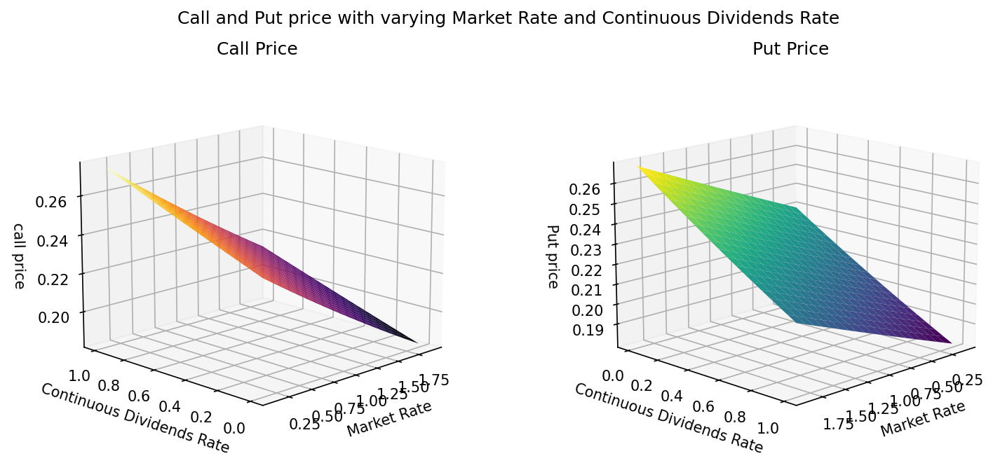

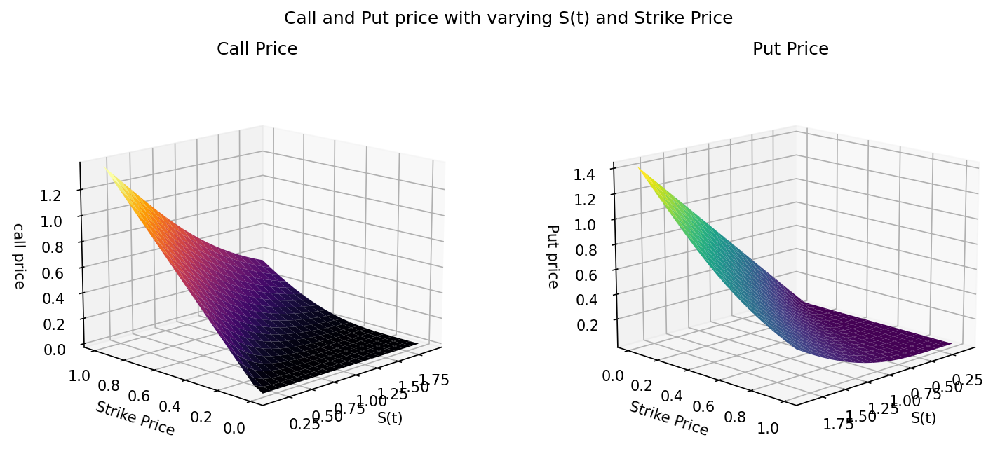

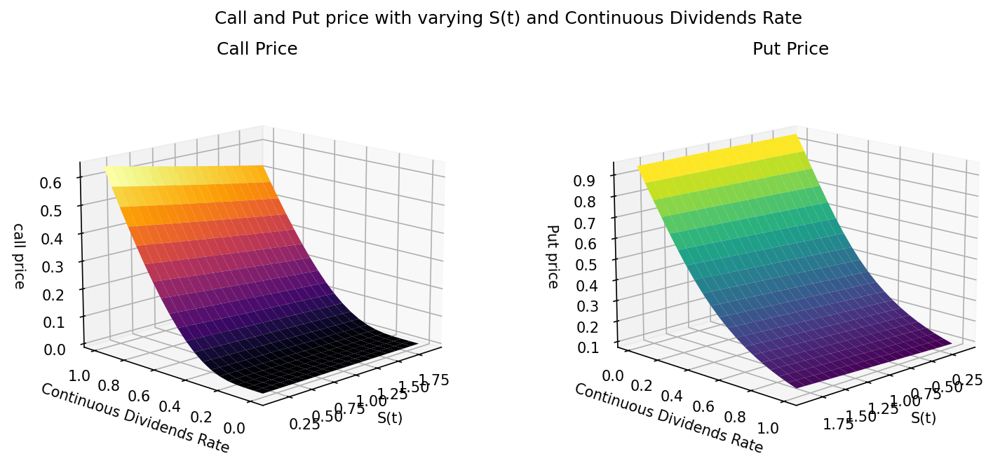

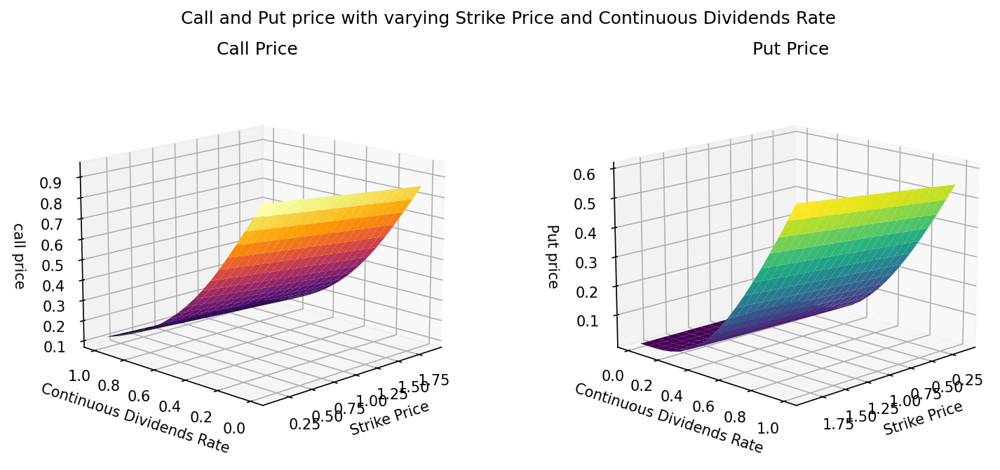

In [8]:
def optionPrice(t, T, sigma, r, x, K, q, c):
    if(T==t):
        if c==1:
            return max(x-K,0)
        else :
            return max(K-x,0)
    d1 = (math.log(x/K)+(r-q+(sigma*sigma)/2)*(T-t))/(sigma*(math.sqrt(T-t)))
    d2 = d1-(sigma*(math.sqrt(T-t)))
    call_p = x*math.pow(math.e,-q*(T-t))*(norm(0,1).cdf(d1))-K*math.pow(math.e,-r*(T-t))*(norm(0,1).cdf(d2))
    if c == 1:
        return call_p
    else:
        return call_p+K*math.pow(math.e,-r*(T-t))-x*math.pow(math.e,-q*(T-t))

# def optionPrice(t, T, sigma, r, x, K, q, c):
varying = []
varying.append(np.linspace(0,1,20))
varying.append(np.linspace(1,2,20))
varying.append(np.linspace(0.1,0.9,20))
varying.append(np.linspace(0.01,0.1,20))
varying.append(np.linspace(0.01,1.5,20))
varying.append(np.linspace(0.05,1.5,20))
varying.append(np.linspace(0,0.1,20))
names = ["start time", "time Period", "Sigma", "Market Rate", "S(t)", "Strike Price", "Continuous Dividends Rate"]
for i in range(1,7):
    fig, ax = plt.subplots(nrows = 1,ncols = 2)
    for st in [0,0.2,0.4,0.6,0.8,1]:
        call_p = []
        put_p = []
        params = [st, 1, 0.6, 0.05, 1, 1, 0.05]
        for ii in range(len(varying[i])):
            params[i]=varying[i][ii]
            call_p.append(optionPrice(params[0],params[1],params[2],params[3],params[4],params[5],params[6],1))
            put_p.append(optionPrice(params[0],params[1],params[2],params[3],params[4],params[5],params[6],0))
            fig.suptitle("Call and Put price with varying "+names[i])
        ax[0].plot(varying[i],call_p)
        ax[1].plot(varying[i],put_p)
    fig.set_size_inches(12, 5)
    fig.set_dpi(150)
    ax[0].set_title("Call Price")
    ax[0].set_xlabel(names[i])
    ax[0].set_ylabel("call price")
    ax[1].plot(varying[i],put_p)
    ax[1].set_title("Put Price")
    ax[1].set_xlabel(names[i])
    ax[1].set_ylabel("Put price")
    ax[0].legend([0,0.2,0.4,0.6,0.8,1])
    ax[1].legend([0,0.2,0.4,0.6,0.8,1])
    plt.show()

for i in range(7):
    for j in range(i+1,7):
        fig, ax = plt.subplots(nrows = 1,ncols = 2,subplot_kw={"projection": "3d"})
        call_p = np.zeros((20,20))
        put_p = np.zeros((20,20))
        p_axis, q_axis = np.meshgrid(varying[i],varying[j])
        params = [0, 1, 0.6, 0.05, 1, 1, 0.05]
        for ii in range(len(p_axis)):
            for jj in range(len(q_axis)):
                params[i]=varying[i][ii]
                params[j]=varying[j][jj]
                call_p[ii][jj]=optionPrice(params[0],params[1],params[2],params[3],params[4],params[5],params[6],1)
                put_p[ii][jj]=optionPrice(params[0],params[1],params[2],params[3],params[4],params[5],params[6],0)
        call_p=call_p.T
        put_p=put_p.T
        fig.suptitle("Call and Put price with varying "+names[i]+" and "+names[j])
        fig.set_size_inches(12, 5)
        fig.set_dpi(150)
        ax[0].plot_surface(S_axis,t_axis,call_p,cmap='inferno')
        ax[0].set_title("Call Price")
        ax[0].set_xlabel(names[i])
        ax[0].set_ylabel(names[j])
        ax[0].set_zlabel("call price")
        ax[1].plot_surface(S_axis,t_axis,put_p,cmap='viridis')
        ax[1].set_title("Put Price")
        ax[1].set_xlabel(names[i])
        ax[1].set_ylabel(names[j])
        ax[1].set_zlabel("Put price")
        ax[0].view_init(15,-135)
        ax[1].view_init(15,45)
        plt.show()
    
